In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
pd.set_option('display.max_rows', None)
import numpy as np 
import matplotlib.pylab as plt
import seaborn as sns


Bad key "text.kerning_factor" on line 4 in
E:\software\anaconda\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
original_data = pd.read_excel('./demo/data/original_data.xls')

In [3]:
original_data['热水器编号'].unique()

array(['R_00001'], dtype=object)

In [4]:
heater_data = original_data.drop('热水器编号',axis = 1)

In [5]:
heater_data

,发生时间,开关机状态,加热中,保温中,有无水流,实际温度,热水量,水流量,节能模式,加热剩余时间,当前设置温度
0,20141019063917,关,关,关,无,30°C,0%,0,关,0分钟,50°C
1,20141019070154,关,关,关,无,30°C,0%,0,关,0分钟,50°C
2,20141019070156,关,关,关,无,30°C,0%,8,关,0分钟,50°C
3,20141019071230,关,关,关,无,30°C,0%,0,关,0分钟,50°C
4,20141019071236,关,关,关,无,29°C,0%,0,关,0分钟,50°C
5,20141019071602,关,关,关,无,30°C,0%,0,关,0分钟,50°C
6,20141019071608,关,关,关,无,29°C,0%,0,关,0分钟,50°C
7,20141019072005,关,关,关,无,30°C,0%,0,关,0分钟,50°C
8,20141019072010,关,关,关,无,29°C,0%,0,关,0分钟,50°C
9,20141019072153,关,关,关,无,30°C,0%,0,关,0分钟,50°C


In [6]:
print(heater_data.info())
print(heater_data.describe())
print(heater_data.count())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18840 entries, 0 to 18839
Data columns (total 11 columns):
发生时间      18840 non-null int64
开关机状态     18840 non-null object
加热中       18840 non-null object
保温中       18840 non-null object
有无水流      18840 non-null object
实际温度      18840 non-null object
热水量       18840 non-null object
水流量       18840 non-null int64
节能模式      18840 non-null object
加热剩余时间    18840 non-null object
当前设置温度    18840 non-null object
dtypes: int64(2), object(9)
memory usage: 1.6+ MB
None
               发生时间           水流量
count  1.884000e+04  18840.000000
mean   2.014106e+13     12.870594
std    4.021530e+07     17.122814
min    2.014102e+13      0.000000
25%    2.014102e+13      0.000000
50%    2.014103e+13      0.000000
75%    2.014111e+13     26.000000
max    2.014111e+13     77.000000
发生时间      18840
开关机状态     18840
加热中       18840
保温中       18840
有无水流      18840
实际温度      18840
热水量       18840
水流量       18840
节能模式      18840
加热剩余时间    18840
当前设置温度    18840
dtyp

# 可见 数据中没有NULL值

Text(0.5, 1, '不同水流状态记录数')

<Figure size 432x360 with 0 Axes>

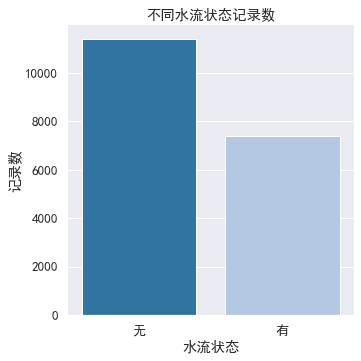

In [7]:
# 绘制条形图
fig = plt.figure(figsize=(6, 5))  # 设置画布大小
sns.set(style="darkgrid")
sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 2.5})
plt.rcParams['font.sans-serif'] = 'SimHei'  # 设置中文显示
plt.rcParams['axes.unicode_minus'] = False
sns.catplot(kind="count",
            data=heater_data,
            x="有无水流",
            aspect=1,
            height=5,
            palette='tab20')
plt.xlabel('水流状态')
plt.ylabel('记录数')
plt.title('不同水流状态记录数')


Text(0.5, 1, '水流量分布箱线图')

<Figure size 360x576 with 0 Axes>

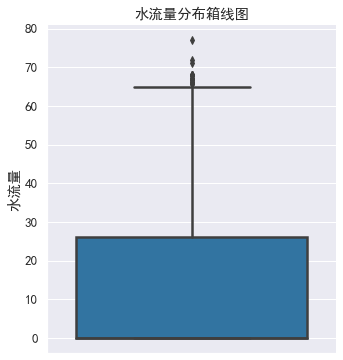

In [8]:
# 绘制水流量分布箱型图
fig = plt.figure(figsize=(5, 8))
sns.catplot(
    kind="box",
    data=heater_data,
    y='水流量',  # 设置x轴标题
    aspect=1,
    height=5,
    palette='tab20')
plt.title('水流量分布箱线图')
#显示y坐标轴的底线
#plt.grid(axis='y')


# 数据探索分析 EDA

# 用水停顿时间间隔为一条水流量不为0的流水记录同下一条水流量不为0 的流水记录之间的时间间隔

In [14]:
heater_data['发生时间'] = pd.to_datetime(heater_data['发生时间'],format = '%Y%m%d%H%M%S')
water_use = heater_data[heater_data['水流量'] > 0]
water_use['diff_minutes'] = abs(water_use['发生时间'].diff(-1).fillna(0).dt.total_seconds() / 60 )

In [15]:
water_use

,发生时间,开关机状态,加热中,保温中,有无水流,实际温度,热水量,水流量,节能模式,加热剩余时间,当前设置温度,diff_minutes
2,2014-10-19 07:01:56,关,关,关,无,30°C,0%,8,关,0分钟,50°C,36.333333
56,2014-10-19 07:38:16,关,关,关,无,30°C,0%,8,关,0分钟,50°C,128.366667
381,2014-10-19 09:46:38,关,关,关,无,29°C,0%,16,关,0分钟,50°C,0.033333
382,2014-10-19 09:46:40,关,关,关,无,29°C,0%,13,关,0分钟,50°C,0.583333
384,2014-10-19 09:47:15,关,关,关,有,29°C,0%,20,关,0分钟,50°C,123.033333
404,2014-10-19 11:50:17,关,关,关,有,29°C,0%,22,关,0分钟,50°C,126.066667
407,2014-10-19 13:56:21,关,关,关,无,29°C,0%,8,关,0分钟,50°C,98.300000
410,2014-10-19 15:34:39,关,关,关,有,29°C,0%,36,关,0分钟,50°C,0.016667
411,2014-10-19 15:34:40,关,关,关,有,29°C,0%,32,关,0分钟,50°C,0.083333
412,2014-10-19 15:34:45,关,关,关,有,29°C,0%,31,关,0分钟,50°C,0.033333


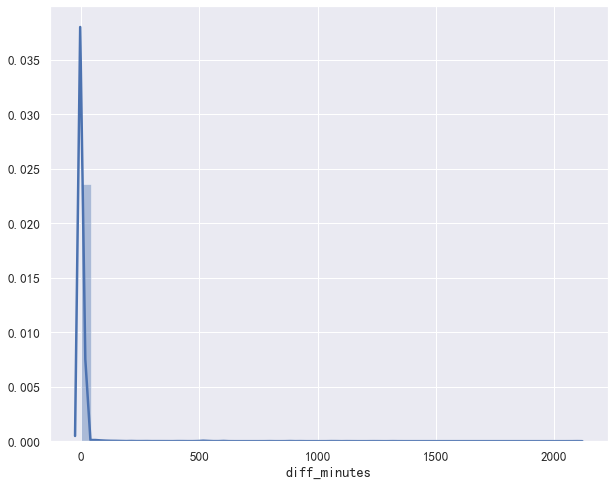

In [20]:
plt.figure(figsize = (10,8))
sns.distplot(water_use['diff_minutes'])
plt.show()

In [39]:
bining = [0,0.1,0.2,0.3,0.5,1,2,3,4,5,6,7,8,9,10,11,12,13]
percetage = []
thr = []
for i in range(len(bining)-1):
    thr.append((bining[i],bining[i+ 1]))
    percetage.append(len(water_use[(water_use['diff_minutes'] >= bining[i]) & (water_use['diff_minutes'] < bining[i+1]) ]) / len(water_use) * 100)
percetage.append(len(water_use[(water_use['diff_minutes'] >= 13) ])/ len(water_use) * 100)
thr.append(13)

In [58]:
water_use_pause_time = pd.DataFrame(percetage,columns = ['percentage'] )
water_use_pause_time['time_interval'] = thr
water_use_pause_time.columns = ['percentage','time_interval']
water_use_pause_time

,percentage,time_interval
0,72.570166,"(0, 0.1)"
1,18.074324,"(0.1, 0.2)"
2,4.274948,"(0.2, 0.3)"
3,1.520270,"(0.3, 0.5)"
4,0.558732,"(0.5, 1)"
5,0.402807,"(1, 2)"
6,0.194906,"(2, 3)"
7,0.181913,"(3, 4)"
8,0.012994,"(4, 5)"
9,0.103950,"(5, 6)"


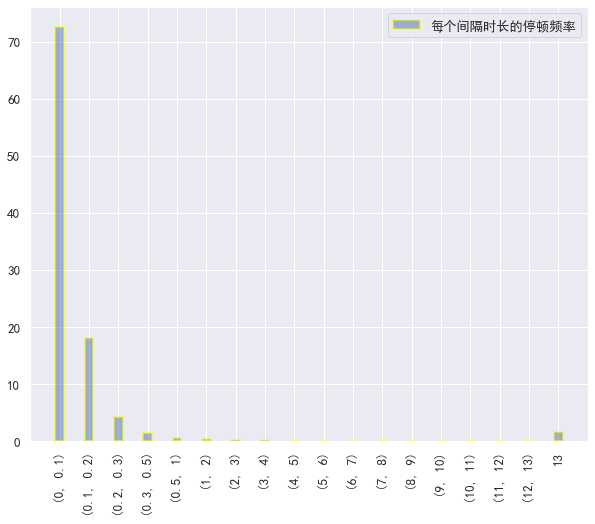

In [68]:
plt.figure(figsize = (10,8))
plt.bar(np.arange(len(water_use_pause_time)),water_use_pause_time['percentage'],alpha=0.5, width=0.3, color='b', edgecolor='yellow', label='每个间隔时长的停顿频率', lw=2)
plt.xticks(np.arange(18), water_use_pause_time['time_interval'], rotation=90)#rotation控制倾斜角度 
plt.legend(loc='upper right')
plt.show()

# 总结分析 ：
 
## 由上面的表和图可知，停顿时间间隔为0-0.3分钟的频率很高，根据日常用水经验可以判断其为一次用水时间中的停顿；停顿时间间隔为6-13分钟的频率较低，分析其为两次用水事件之间的停顿间隔。两次用水事件的停顿时间间隔分布在3-7分钟。